# **MACHINE LEARNING PROYECT**

The World Health Organization (WHO) and the United Nations are concerned by the rising suicide rates worldwide, and they want to implemet effective measures to reduce these numbers. To treat this challenge, they want to develop a machine learning model that can identify wich countries needs more resources in terms of mental health and suicide porevention.

### ¿What is our objective?

* Business problem:
 ¿Could we create a model to predict the suicide rates per 100.000 habitants in a selected country using demographic, economic and mental health characteristics, such as age, sex, GDP per capita, gross national income per capita, inflation rate, and proportion of labor force employed?

* Identify whether the most important risk factors associated with high suicide rates in each country are socioeconomic.

* Rank countries according to their perceived need for mental health and suicide prevention intervention and resources.


### Data description

* **RegionCode:** Represents the continent code to which the country belongs.

* **RegionName:** Indicates the name of the continent to which the country belongs.

* **CountryCode:** This field provides the unique code assigned to each country.

* **CountryName:** Specifies the name of the country to which the data belongs.

* **Year:** Indicates the year to which the data corresponds.

* **Sex:** Indicates the gender of the subject.

* **AgeGroup:** Categorizes individuals into specific age ranges.

* **Generation:** Provides information about the generation to which the individuals under study belong. For example, "Baby Boomers," "Generation X," "Millennials," etc.

* **SuicideCount:** Indicates the total number of reported suicides. It is a direct measure of the number of recorded suicides.

* **CauseSpecificDeathPercentage:** This field represents the percentage of deaths specifically caused by suicide relative to the total deaths in the population. It provides a measure of the prevalence of suicides compared to other causes of death.

* **DeathRatePer100K:** Indicates the suicide rate per 100,000 inhabitants in the population under study.

* **Population:** Represents the total population in the specific category provided in the dataset.

* **GDP:** Indicates the Gross Domestic Product (GDP) of the country in the corresponding year. GDP is a measure of the economic value of all goods and services produced in a country during a specific period.

* **GDPPerCapita:** Represents the GDP per capita, which is the total GDP divided by the total population of the country in the corresponding year. It provides a measure of the average income per person in the country.

* **GrossNationalIncome:** Indicates the Gross National Income (GNI) of the country in the corresponding year. GNI is similar to GDP but also includes net income from abroad.

* **GNIPerCapita:** Represents the Gross National Income (GNI) per capita, which is the total GNI divided by the total population of the country in the corresponding year. It provides a measure of the average income per person in the country, including income from abroad.

* **InflationRate:** This field indicates the annual inflation rate of the country in the corresponding year. The inflation rate represents the percentage change in the price level of goods and services in a country during a specific period.

* **EmploymentPopulationRatio:** Represents the proportion of the employed working-age population (employment) relative to the total population of working age (usually between 15 and 64 years) in the country in the corresponding year.







************************

### **Machine learning toolbox setup**

In [1]:
import joblib
import pandas as pd
import ML_ToolBox as tb
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import bootcampviztools as bt

from catboost import CatBoostClassifier,CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import LinearRegression, ridge_regression, Ridge, Lasso
from sklearn.metrics import classification_report, mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from xgboost import XGBClassifier, XGBRegressor







## ¿Could we create a model to predict the suicide rates per 100.000 habitants in a selected country using demographic, economic and mental health characteristics, such as age, sex, GDP per capita, gross national income per capita, inflation rate, and proportion of labor force employed?

#### Import suicide rates dataset

In [2]:
suicide = pd.read_csv("data/suicide_rates_1990-2022.csv")

In [3]:
#data copy
df = suicide.copy()

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118560 entries, 0 to 118559
Data columns (total 18 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   RegionCode                    118560 non-null  object 
 1   RegionName                    118560 non-null  object 
 2   CountryCode                   118560 non-null  object 
 3   CountryName                   118560 non-null  object 
 4   Year                          118560 non-null  int64  
 5   Sex                           118560 non-null  object 
 6   AgeGroup                      118560 non-null  object 
 7   Generation                    118560 non-null  object 
 8   SuicideCount                  118096 non-null  float64
 9   CauseSpecificDeathPercentage  114271 non-null  float64
 10  DeathRatePer100K              107896 non-null  float64
 11  Population                    112640 non-null  float64
 12  GDP                           111320 non-nul

In [5]:
df.head()

,RegionCode,RegionName,CountryCode,CountryName,Year,Sex,AgeGroup,Generation,SuicideCount,CauseSpecificDeathPercentage,DeathRatePer100K,Population,GDP,GDPPerCapita,GrossNationalIncome,GNIPerCapita,InflationRate,EmploymentPopulationRatio
0,EU,Europe,ALB,Albania,1992,Male,0-14 years,Generation Alpha,0.0,0.000000,0.000000,3247039.0,652174990.8,200.85222,906184212.3,1740.0,226.005421,45.315
1,EU,Europe,ALB,Albania,1992,Male,0-14 years,Generation Alpha,0.0,0.000000,0.000000,3247039.0,652174990.8,200.85222,906184212.3,1740.0,226.005421,45.315
2,EU,Europe,ALB,Albania,1992,Male,0-14 years,Generation Alpha,0.0,0.000000,0.000000,3247039.0,652174990.8,200.85222,906184212.3,1740.0,226.005421,45.315
3,EU,Europe,ALB,Albania,1992,Male,0-14 years,Generation Alpha,0.0,0.000000,0.000000,3247039.0,652174990.8,200.85222,906184212.3,1740.0,226.005421,45.315
4,EU,Europe,ALB,Albania,1992,Male,15-24 years,Generation Z,5.0,3.401361,3.531073,3247039.0,652174990.8,200.85222,906184212.3,1740.0,226.005421,45.315


In [6]:
#I get a look to this column becausa doesn´t make sense
df[df["Generation"] == "Generation Z"] 

,RegionCode,RegionName,CountryCode,CountryName,Year,Sex,AgeGroup,Generation,SuicideCount,CauseSpecificDeathPercentage,DeathRatePer100K,Population,GDP,GDPPerCapita,GrossNationalIncome,GNIPerCapita,InflationRate,EmploymentPopulationRatio
4,EU,Europe,ALB,Albania,1992,Male,15-24 years,Generation Z,5.0,3.401361,3.531073,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315
5,EU,Europe,ALB,Albania,1992,Male,15-24 years,Generation Z,4.0,1.904762,3.276003,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315
24,EU,Europe,ALB,Albania,1992,Female,15-24 years,Generation Z,4.0,6.896552,2.645503,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315
25,EU,Europe,ALB,Albania,1992,Female,15-24 years,Generation Z,3.0,3.529412,2.124646,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315
44,EU,Europe,ALB,Albania,1993,Male,15-24 years,Generation Z,10.0,7.142857,7.468260,3227287.0,1.185315e+09,367.279225,1.024263e+09,2110.0,85.004751,47.798
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118505,AS,Asia,TKM,Turkmenistan,2008,Female,15-24 years,Generation Z,15.0,5.791506,5.894998,5100083.0,1.927152e+10,3778.668539,1.498748e+10,7850.0,NaN,47.919
118524,NAC,North America and the Caribbean,USA,United States of America,2021,Male,15-24 years,Generation Z,1780.0,18.342951,16.353550,332031554.0,2.331510e+13,70219.472450,2.370530e+13,71130.0,4.697859,57.946
118525,NAC,North America and the Caribbean,USA,United States of America,2021,Male,15-24 years,Generation Z,3463.0,19.020157,30.787570,332031554.0,2.331510e+13,70219.472450,2.370530e+13,71130.0,4.697859,57.946
118544,NAC,North America and the Caribbean,USA,United States of America,2021,Female,15-24 years,Generation Z,563.0,15.203889,5.382732,332031554.0,2.331510e+13,70219.472450,2.370530e+13,71130.0,4.697859,57.946


In [7]:
#Drop the columns that i dont need, because is the same as regioncode and countrycode. Generation dosen´t make sense.
df.drop(["RegionCode", "CountryCode", "Generation"], axis = 1, inplace=True)

In [8]:
#Drop duplicated rows
duplicated_rows = df[df.duplicated(keep=False)]

duplicated_rows 


,RegionName,CountryName,Year,Sex,AgeGroup,SuicideCount,CauseSpecificDeathPercentage,DeathRatePer100K,Population,GDP,GDPPerCapita,GrossNationalIncome,GNIPerCapita,InflationRate,EmploymentPopulationRatio
0,Europe,Albania,1992,Male,0-14 years,0.0,0.0,0.0,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315
1,Europe,Albania,1992,Male,0-14 years,0.0,0.0,0.0,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315
2,Europe,Albania,1992,Male,0-14 years,0.0,0.0,0.0,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315
3,Europe,Albania,1992,Male,0-14 years,0.0,0.0,0.0,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315
13,Europe,Albania,1992,Male,55-74 years,0.0,0.0,0.0,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118518,Asia,Turkmenistan,2008,Female,75+ years,0.0,0.0,0.0,5100083.0,1.927152e+10,3778.668539,1.498748e+10,7850.0,NaN,47.919
118520,North America and the Caribbean,United States of America,2021,Male,0-14 years,0.0,0.0,0.0,332031554.0,2.331510e+13,70219.472450,2.370530e+13,71130.0,4.697859,57.946
118521,North America and the Caribbean,United States of America,2021,Male,0-14 years,0.0,0.0,0.0,332031554.0,2.331510e+13,70219.472450,2.370530e+13,71130.0,4.697859,57.946
118540,North America and the Caribbean,United States of America,2021,Female,0-14 years,0.0,0.0,0.0,332031554.0,2.331510e+13,70219.472450,2.370530e+13,71130.0,4.697859,57.946


In [9]:
df.drop_duplicates(inplace = True)

### **Change Categoric Columns to numeric**

#### I do a mapping to change the columns to numeric

In [10]:


mapping_dict_1 = {'Europe': 1,
                  'Asia ': 2,
                  'Central and South America ': 3,
                  'North America and the Caribbean': 4,
                  'Africa': 5,
                  'Oceania': 6
                  }

mapping_dict_2 = {'Male': 1,
                  'Female': 2,
                  'Unknown': 3
                  }

mapping_dict_3 = {'35-54 years': 1,
                  '55-74 years': 2,
                  '75+ years': 3,
                  '25-34 years': 4,
                  '15-24 years': 5,
                  '0-14 years': 6,
                  'Unknown': 7
                  }

df['regionname_num'] = df['RegionName'].map(mapping_dict_1) 
df['sex_num'] = df['Sex'].map(mapping_dict_2)
df['agegroup_num'] = df['AgeGroup'].map(mapping_dict_3)


#### I do a list with all countries to put the number ISO

In [11]:
#I see how many countries have the data
unique_countries = df['CountryName'].unique().tolist()
print(unique_countries)


['Albania', 'Argentina', 'Armenia', 'Australia', 'Austria', 'Azerbaijan', 'Bahrain', 'Bahamas', 'Antigua and Barbuda', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Bosnia and Herzegovina', 'Brazil', 'Brunei Darussalam', 'Bulgaria', 'Cabo Verde', 'Canada', 'Chile', 'Colombia', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus', 'Czechia', 'Denmark', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Estonia', 'Fiji', 'Finland', 'France', 'French Guiana', 'Georgia', 'Germany', 'Greece', 'Grenada', 'Guadeloupe', 'Guatemala', 'Guyana', 'China, Hong Kong SAR', 'Hungary', 'Iceland', 'Iran (Islamic Republic of)', 'Iraq', 'Ireland', 'Israel', 'Italy', 'Jamaica', 'Japan', 'Kazakhstan', 'Republic of Korea', 'Kuwait', 'Kyrgyzstan', 'Latvia', 'Lithuania', 'Luxembourg', 'Maldives', 'Malta', 'Martinique', 'Mauritius', 'Mayotte', 'Mexico', 'Republic of Moldova', 'Montenegro', 'Netherlands', 'New Zealand', 'Nicaragua', 'North Macedonia', 'Norway', 'Panama', 'Paraguay', 'Peru', 'Philippines',

In [12]:
#I writte the iso numbers

mapping_dict_4 = {  
    'Albania': 8,
    'Argentina': 32,
    'Armenia': 51,
    'Australia': 36,
    'Austria': 40,
    'Azerbaijan': 31,
    'Bahrain': 48,
    'Bahamas': 44,
    'Antigua and Barbuda': 28,
    'Barbados': 52,
    'Belarus': 112,
    'Belgium': 56,
    'Belize': 84,
    'Bosnia and Herzegovina': 70,
    'Brazil': 76,
    'Brunei Darussalam': 96,
    'Bulgaria': 100,
    'Cabo Verde': 132,
    'Canada': 124,
    'Chile': 152,
    'Colombia': 170,
    'Costa Rica': 188,
    'Croatia': 191,
    'Cuba': 192,
    'Cyprus': 196,
    'Czechia': 203,
    'Denmark': 208,
    'Dominica': 212,
    'Dominican Republic': 214,
    'Ecuador': 218,
    'Egypt': 818,
    'El Salvador': 222,
    'Estonia': 233,
    'Fiji': 242,
    'Finland': 246,
    'France': 250,
    'French Guiana': 254,
    'Georgia': 268,
    'Germany': 276,
    'Greece': 300,
    'Grenada': 308,
    'Guadeloupe': 312,
    'Guatemala': 320,
    'Guyana': 328,
    'China, Hong Kong SAR': 344,
    'Hungary': 348,
    'Iceland': 352,
    'Iran (Islamic Republic of)': 364,
    'Iraq': 368,
    'Ireland': 372,
    'Israel': 376,
    'Italy': 380,
    'Jamaica': 388,
    'Japan': 392,
    'Kazakhstan': 398,
    'Republic of Korea': 410,
    'Kuwait': 414,
    'Kyrgyzstan': 417,
    'Latvia': 428,
    'Lithuania': 440,
    'Luxembourg': 442,
    'Maldives': 462,
    'Malta': 470,
    'Martinique': 474,
    'Mauritius': 480,
    'Mayotte': 175,
    'Mexico': 484,
    'Republic of Moldova': 498,
    'Montenegro': 499,
    'Netherlands': 528,
    'New Zealand': 554,
    'Nicaragua': 558,
    'North Macedonia': 807,
    'Norway': 578,
    'Panama': 591,
    'Paraguay': 600,
    'Peru': 604,
    'Philippines': 608,
    'Poland': 616,
    'Portugal': 620,
    'Puerto Rico': 630,
    'R?union': 638,
    'Romania': 642,
    'Russian Federation': 643,
    'Saint Kitts and Nevis': 659,
    'Saint Lucia': 662,
    'Saint Vincent and the Grenadines': 670,
    'Serbia': 688,
    'Seychelles': 690,
    'Singapore': 702,
    'Slovakia': 703,
    'Slovenia': 705,
    'South Africa': 710,
    'Spain': 724,
    'Sri Lanka': 144,
    'Suriname': 740,
    'Sweden': 752,
    'Switzerland': 756,
    'Syrian Arab Republic': 760,
    'Tajikistan': 762,
    'Thailand': 764,
    'Trinidad and Tobago': 780,
    'T?rkiye': 792,
    'Turkmenistan': 795,
    'Ukraine': 804,
    'United Kingdom of Great Britain and Northern Ireland': 826,
    'United States of America': 840,
    'Uruguay': 858,
    'Uzbekistan': 860,
    'Venezuela (Bolivarian Republic of)': 862,
    'Jordan': 400,
    'United Arab Emirates': 784,
    'Lebanon': 422,
    'Mongolia': 496,
    'Malaysia': 458,
    'Oman': 512,
    'Qatar': 634
}

#New numeric column
df['countryname_num'] = df['CountryName'].map(mapping_dict_4)

In [13]:
#check new columns
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 95976 entries, 0 to 118559
Data columns (total 19 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   RegionName                    95976 non-null  object 
 1   CountryName                   95976 non-null  object 
 2   Year                          95976 non-null  int64  
 3   Sex                           95976 non-null  object 
 4   AgeGroup                      95976 non-null  object 
 5   SuicideCount                  95684 non-null  float64
 6   CauseSpecificDeathPercentage  92095 non-null  float64
 7   DeathRatePer100K              87733 non-null  float64
 8   Population                    91487 non-null  float64
 9   GDP                           90301 non-null  float64
 10  GDPPerCapita                  90301 non-null  float64
 11  GrossNationalIncome           88007 non-null  float64
 12  GNIPerCapita                  87366 non-null  float64
 13  Infla

### Drop categorical columns

In [14]:
cat_col = ['RegionName','CountryName','Sex', 'AgeGroup']
df.drop(columns = cat_col, axis = 1, inplace = True)

In [15]:
#check
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 95976 entries, 0 to 118559
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Year                          95976 non-null  int64  
 1   SuicideCount                  95684 non-null  float64
 2   CauseSpecificDeathPercentage  92095 non-null  float64
 3   DeathRatePer100K              87733 non-null  float64
 4   Population                    91487 non-null  float64
 5   GDP                           90301 non-null  float64
 6   GDPPerCapita                  90301 non-null  float64
 7   GrossNationalIncome           88007 non-null  float64
 8   GNIPerCapita                  87366 non-null  float64
 9   InflationRate                 84214 non-null  float64
 10  EmploymentPopulationRatio     89097 non-null  float64
 11  regionname_num                57007 non-null  float64
 12  sex_num                       95976 non-null  int64  
 13  agegr

### NaN Treatment

In [16]:
#hacer plort en las numéricasd para ver si es simétrica e imputar media o mediana

In [17]:
#Check the columns that have NaNs
df.isnull().sum()

Year                                0
SuicideCount                      292
CauseSpecificDeathPercentage     3881
DeathRatePer100K                 8243
Population                       4489
GDP                              5675
GDPPerCapita                     5675
GrossNationalIncome              7969
GNIPerCapita                     8610
InflationRate                   11762
EmploymentPopulationRatio        6879
regionname_num                  38969
sex_num                             0
agegroup_num                        0
countryname_num                     0
dtype: int64

In [18]:
#NaN rows
nan_rows = df[df.isnull().any(axis=1)]


nan_rows
#22754 rows × 16 columns

,Year,SuicideCount,CauseSpecificDeathPercentage,DeathRatePer100K,Population,GDP,GDPPerCapita,GrossNationalIncome,GNIPerCapita,InflationRate,EmploymentPopulationRatio,regionname_num,sex_num,agegroup_num,countryname_num
19,1992,0.0,NaN,NaN,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315,1.0,1,7,8
39,1992,0.0,NaN,NaN,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315,1.0,2,7,8
59,1993,0.0,0.000000,NaN,3227287.0,1.185315e+09,367.279225,1.024263e+09,2110.0,85.004751,47.798,1.0,1,7,8
79,1993,0.0,0.000000,NaN,3227287.0,1.185315e+09,367.279225,1.024263e+09,2110.0,85.004751,47.798,1.0,2,7,8
99,1994,2.0,1.030928,NaN,3207536.0,1.880951e+09,586.416135,1.216681e+09,2300.0,22.565053,50.086,1.0,1,7,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118516,2008,1.0,0.060643,4.004325,5100083.0,1.927152e+10,3778.668539,1.498748e+10,7850.0,NaN,47.919,NaN,2,3,795
118517,2008,0.0,0.000000,0.000000,5100083.0,1.927152e+10,3778.668539,1.498748e+10,7850.0,NaN,47.919,NaN,2,3,795
118519,2008,0.0,NaN,NaN,5100083.0,1.927152e+10,3778.668539,1.498748e+10,7850.0,NaN,47.919,NaN,2,7,795
118539,2021,4.0,5.714286,NaN,332031554.0,2.331510e+13,70219.472450,2.370530e+13,71130.0,4.697859,57.946,4.0,1,7,840


I see median of european countrys because is de most NaN continent

In [19]:

nulls_by_country = df.groupby('regionname_num').apply(lambda x: x.isnull().sum())

nulls_by_country_sorted = nulls_by_country.sum(axis=1).sort_values(ascending=False)

print(nulls_by_country_sorted)

regionname_num
1.0    19649
4.0    16373
5.0     6470
6.0      693
dtype: int64


I imput the median to the Nan values

In [20]:
median_values = df.median()
df.fillna(median_values, inplace=True)

In [21]:
tb.describe_df(df)

,Year,SuicideCount,CauseSpecificDeathPercentage,DeathRatePer100K,Population,GDP,GDPPerCapita,GrossNationalIncome,GNIPerCapita,InflationRate,EmploymentPopulationRatio,regionname_num,sex_num,agegroup_num,countryname_num
Data_Type,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64
Missings(%),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Unique_Values,33,1868,46425,70961,2766,2735,2735,2665,1999,2567,2502,4,3,7,117
Card(%),0.03,1.95,48.37,73.94,2.88,2.85,2.85,2.78,2.08,2.67,2.61,0.0,0.0,0.01,0.12


In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 95976 entries, 0 to 118559
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Year                          95976 non-null  int64  
 1   SuicideCount                  95976 non-null  float64
 2   CauseSpecificDeathPercentage  95976 non-null  float64
 3   DeathRatePer100K              95976 non-null  float64
 4   Population                    95976 non-null  float64
 5   GDP                           95976 non-null  float64
 6   GDPPerCapita                  95976 non-null  float64
 7   GrossNationalIncome           95976 non-null  float64
 8   GNIPerCapita                  95976 non-null  float64
 9   InflationRate                 95976 non-null  float64
 10  EmploymentPopulationRatio     95976 non-null  float64
 11  regionname_num                95976 non-null  float64
 12  sex_num                       95976 non-null  int64  
 13  agegr

*****************************************

## **MINI EDA**

I check the correlation of dataframe features  with a heatmap 

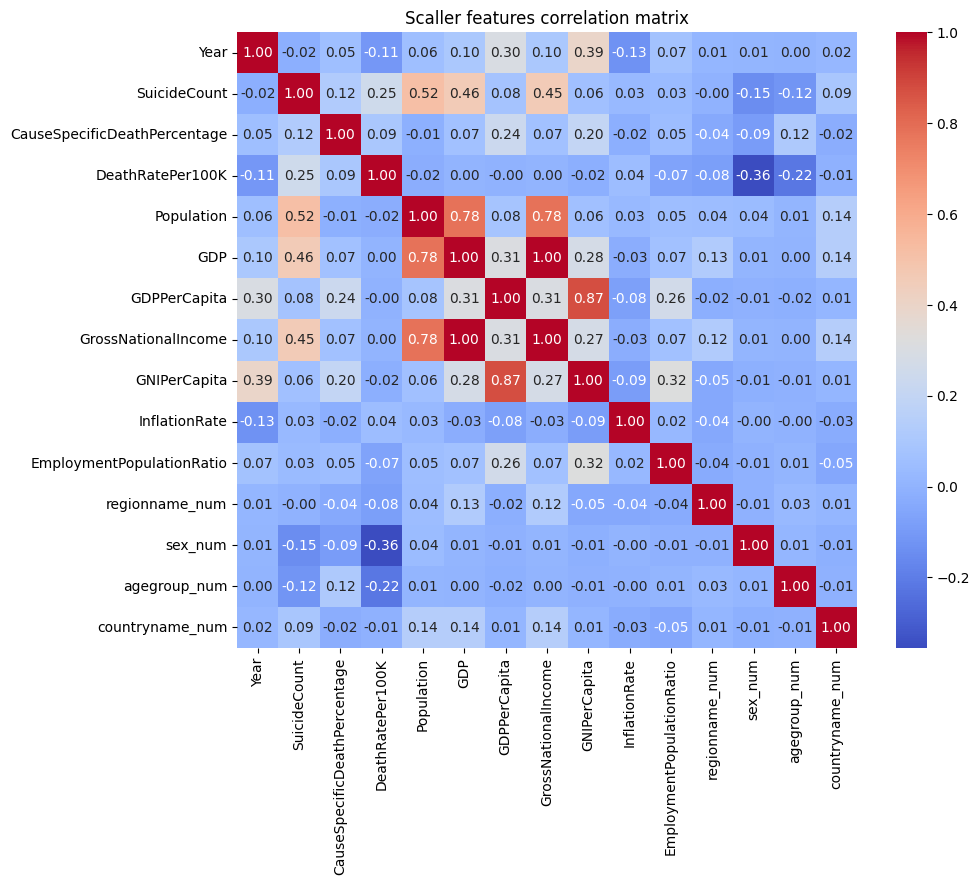

In [23]:
# Calculate correlation matrix
corr_matrix = np.corrcoef(df, rowvar=False)


plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", xticklabels=df.columns, yticklabels=df.columns)
plt.title("Scaller features correlation matrix")
plt.show()


I drop GNIPerCapita and GrossNationalIncome  because they have high correlationship

In [25]:

columns_to_drop_2 = ["GNIPerCapita", "GrossNationalIncome"]
df.drop(columns_to_drop_2, inplace = True, axis = 1 )
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 95976 entries, 0 to 118559
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Year                          95976 non-null  int64  
 1   SuicideCount                  95976 non-null  float64
 2   CauseSpecificDeathPercentage  95976 non-null  float64
 3   DeathRatePer100K              95976 non-null  float64
 4   Population                    95976 non-null  float64
 5   GDP                           95976 non-null  float64
 6   GDPPerCapita                  95976 non-null  float64
 7   InflationRate                 95976 non-null  float64
 8   EmploymentPopulationRatio     95976 non-null  float64
 9   regionname_num                95976 non-null  float64
 10  sex_num                       95976 non-null  int64  
 11  agegroup_num                  95976 non-null  int64  
 12  countryname_num               95976 non-null  int64  
dtypes: fl

### **Train test split**

In [26]:
train_set, test_set = train_test_split(df, test_size= 0.2, random_state= 42)

Imput the target

In [27]:
target = "DeathRatePer100K"


In [28]:
train_set["DeathRatePer100K"].value_counts()

DeathRatePer100K
0.000000     10122
7.570596      6583
20.000000       16
33.333333       15
28.571429       14
             ...  
11.839136        1
6.985801         1
6.884931         1
28.862511        1
15.987108        1
Name: count, Length: 57138, dtype: int64

Distribution of target

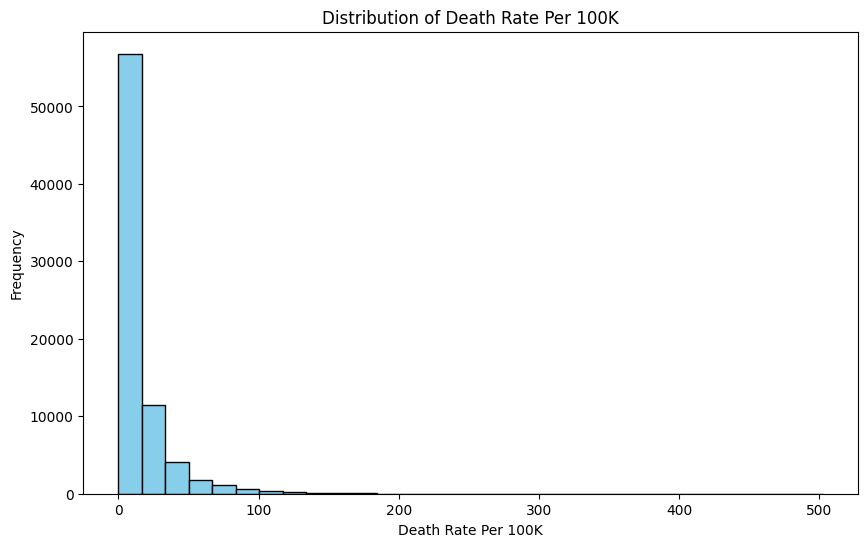

In [29]:
plt.figure(figsize=(10, 6))
plt.hist(train_set['DeathRatePer100K'], bins=30, color='skyblue', edgecolor='black')
plt.xlabel('Death Rate Per 100K')
plt.ylabel('Frequency')
plt.title('Distribution of Death Rate Per 100K')
plt.show()

Check features distribution



### **Histgrams, KDE and boxplot**

(12, 2)


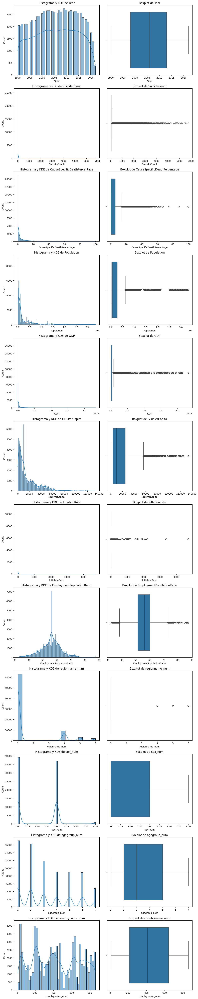

In [30]:
bt.plot_combined_graphs(train_set, [col for col in train_set.columns if col != target])

### **Pairplot**

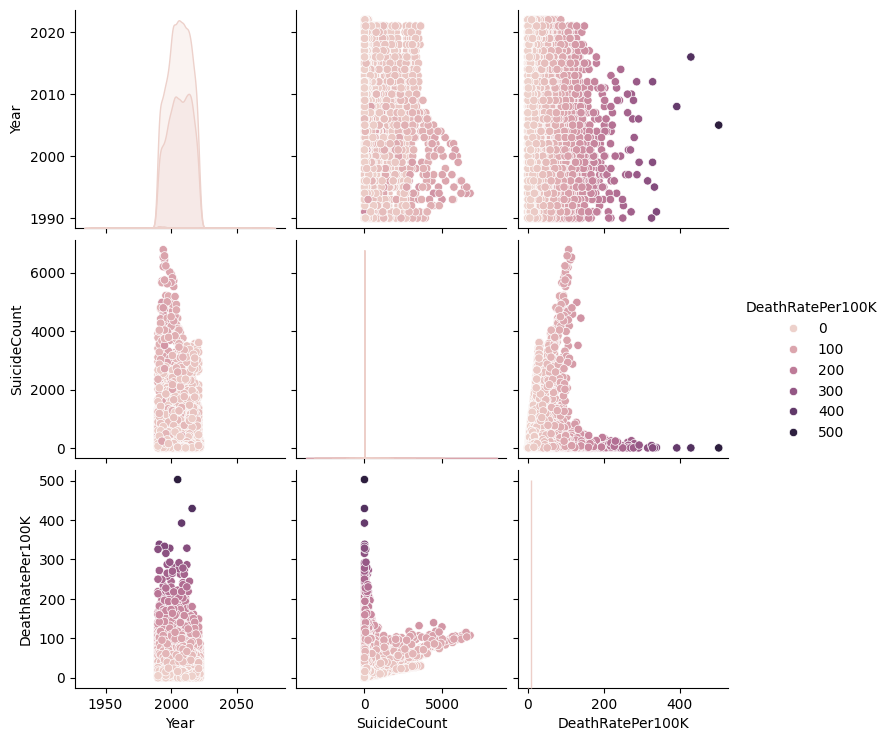

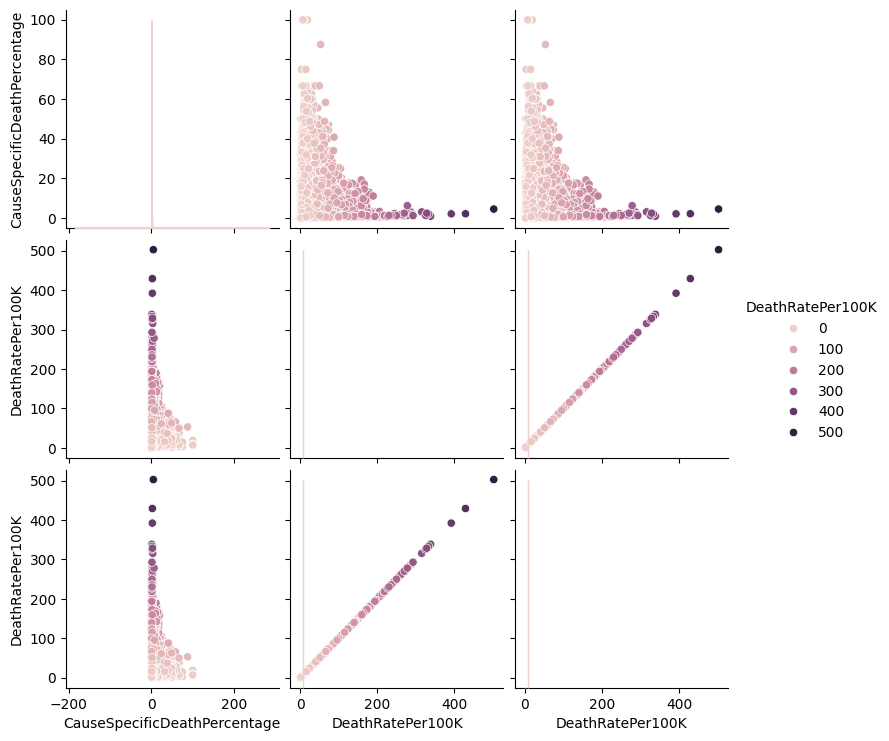

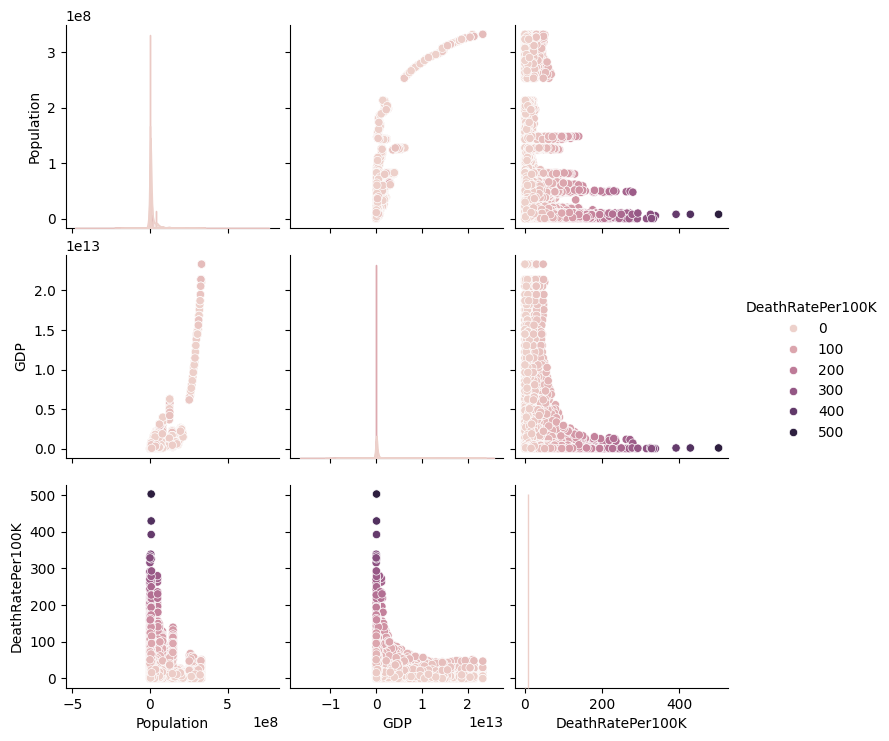

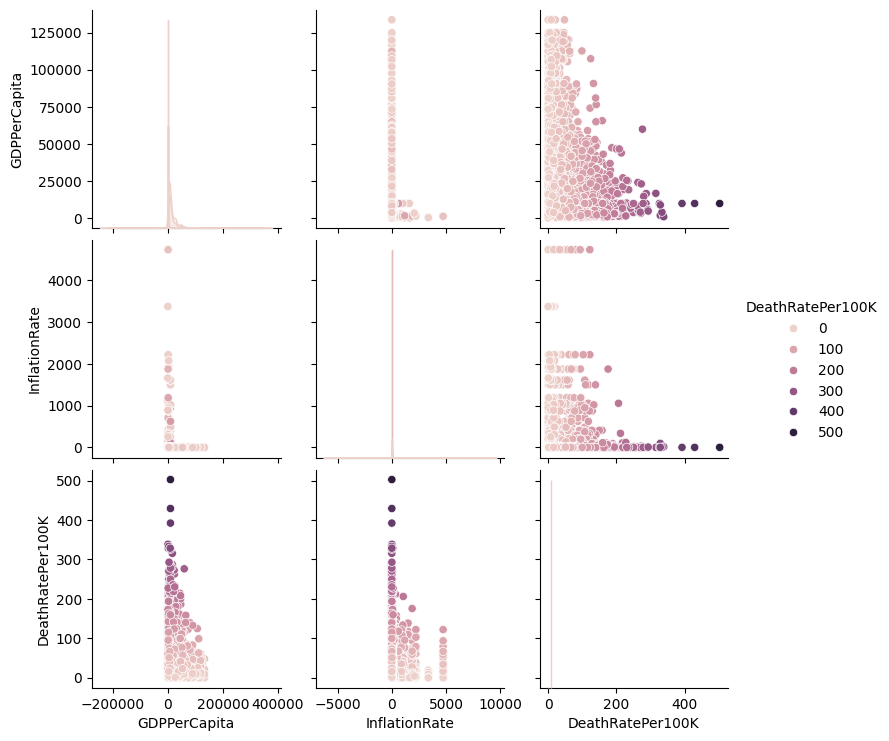

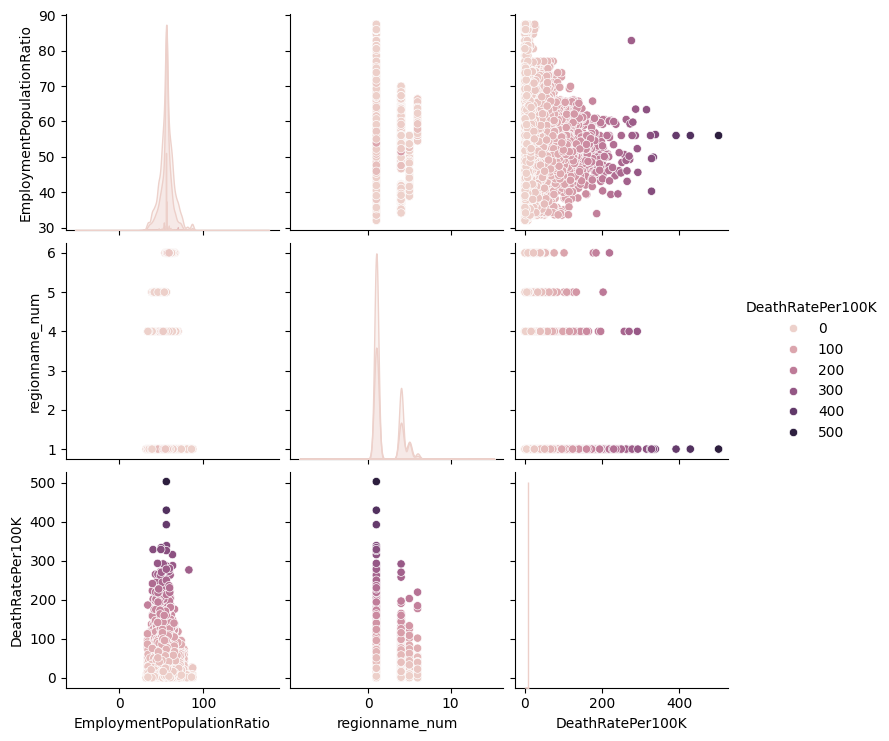

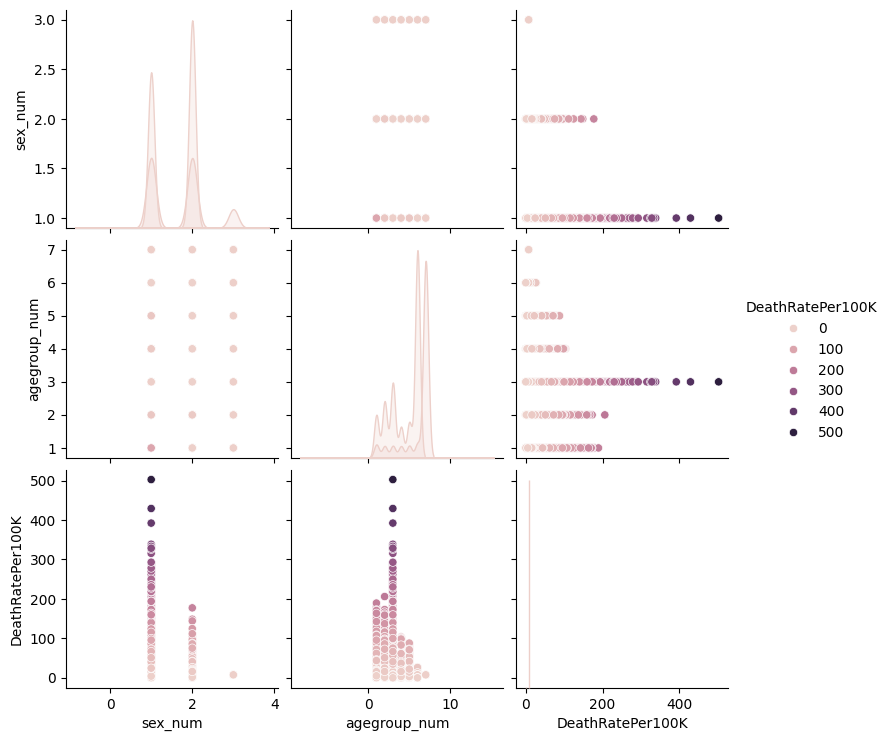

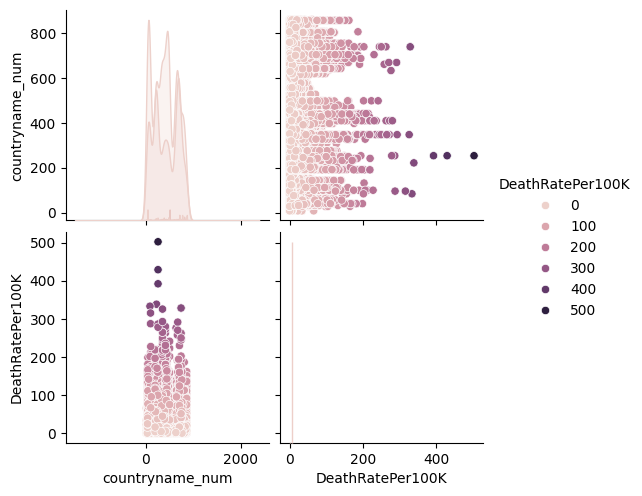

In [35]:
for i in range(0, len(train_set.columns), 2):
    columns_to_plot = train_set.columns[i:i+2].tolist() + ["DeathRatePer100K"]
    sns.pairplot(train_set, vars=columns_to_plot, hue=target)
#eliminar eel hue y  añadir el deathrateper100k al columns to plot, para compararla con todas las variables

I´m going to use all the features, because i need to use all the data to do the model.


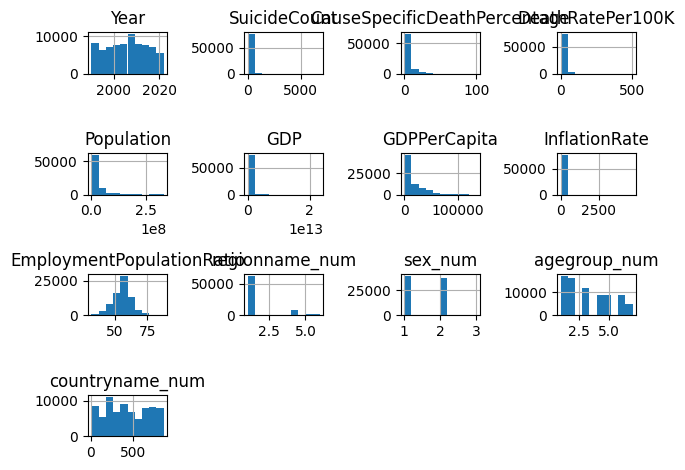

In [37]:
train_set.hist()
plt.tight_layout()

***********************************************************************************************************************************

**************************

## Start to fit models

In [36]:
X_train = train_set.drop(target, axis = 1)
y_train = train_set[target]
X_test = test_set.drop(target, axis = 1)
y_test = test_set[target]

In [39]:
X_train.shape

(76780, 12)

### Scall models

In [40]:
scaler = StandardScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns= X_train.columns)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns= X_test.columns)

Check the correlation heatmap with the scalled model

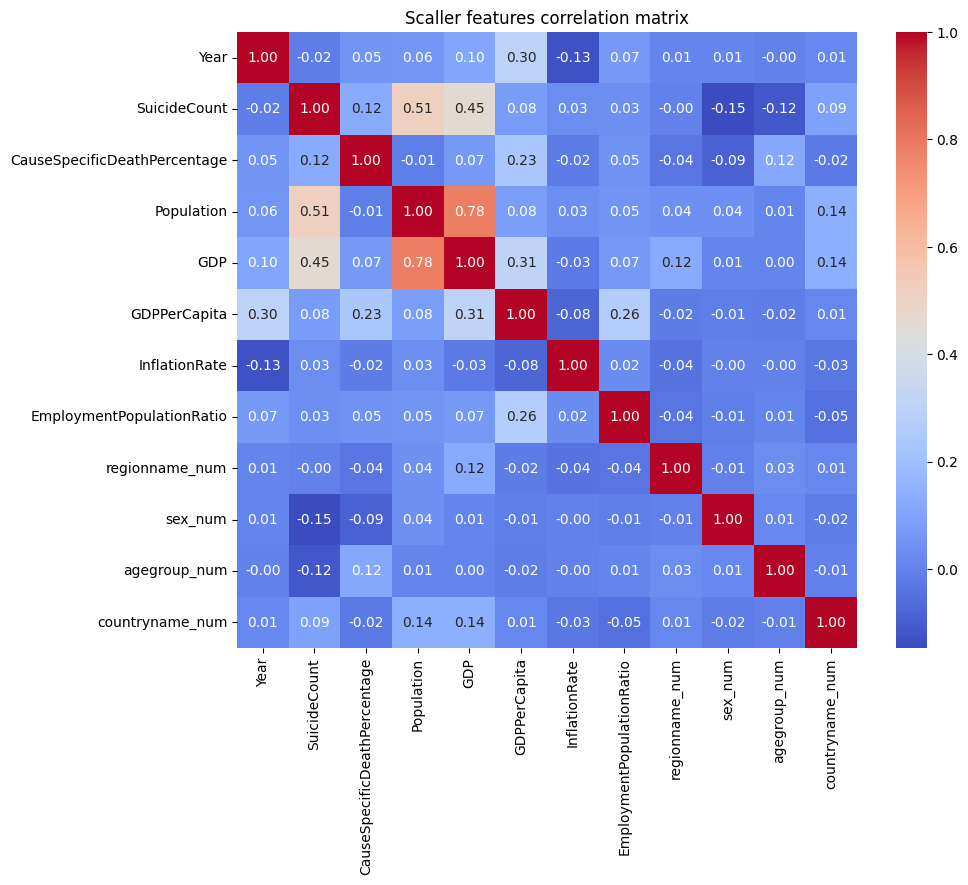

In [41]:
X_train_scaled = scaler.fit_transform(X_train)

# Calculate correlation matrix
corr_matrix = np.corrcoef(X_train_scaled, rowvar=False)

# heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", xticklabels=X_train.columns, yticklabels=X_train.columns)
plt.title("Scaller features correlation matrix")
plt.show()

## Models

### I'm looking for the best model so i see the cross validation and i do a baseline

#### Cross validation

performs cross-validation on each model using the training data , and calculates MAE, MSE, MAPE and R² score for each model. 

In [ ]:

X = X_train  
y = y_train  

models = {
    'Ridge': Ridge(),
    'XGBoost': XGBRegressor(),
    'LightGBM': LGBMRegressor(verbose=-100),
    'Linear Regression': LinearRegression(),
    'Decision Tree Regressor': DecisionTreeRegressor(),
    'Random Forest': RandomForestRegressor(),
}

# Dictionary to store scores
scores_dict = {}

for name, model in models.items():
    
    # Cross-validation for MAE, MAPE, R2 AND MSE
    mae_scores = cross_val_score(model, X, y, cv=5, scoring='neg_mean_absolute_error')
    mae_mean = np.mean(-mae_scores)
    
    
    mse_scores = cross_val_score(model, X, y, cv=5, scoring='neg_mean_squared_error')
    mse_mean = np.mean(-mse_scores)

   
    r2_scores = cross_val_score(model, X, y, cv=5, scoring='r2')
    r2_mean = np.mean(r2_scores)
    

    mape_scores = cross_val_score(model, X, y, cv=5, scoring='neg_mean_absolute_percentage_error')
    mape_mean = np.mean(-mape_scores)
    
 # show results   
    scores_dict[name] = {'MAE': mae_mean, 'MSE': mse_mean, 'R2': r2_mean, 'MAPE': mape_mean}

for name, scores in scores_dict.items():
    print(f'{name}: MAE = {scores["MAE"]:.4f}, MSE = {scores["MSE"]:.4f}, R2 = {scores["R2"]:.4f}, MAPE = {scores["MAPE"]:.4f}')
    print("*********************************************************************************************")

# Find the model with the best average score for each metric
best_model_mae = min(scores_dict, key=lambda x: scores_dict[x]['MAE'])
best_model_mse = min(scores_dict, key=lambda x: scores_dict[x]['MSE'])
best_model_r2 = max(scores_dict, key=lambda x: scores_dict[x]['R2'])
best_model_mape = min(scores_dict, key=lambda x: scores_dict[x]['MAPE'])

# Print the results
print(f'Best Model for MAE: {best_model_mae}, Score: {scores_dict[best_model_mae]["MAE"]:.4f}')
print(f'Best Model for MSE: {best_model_mse}, Score: {scores_dict[best_model_mse]["MSE"]:.4f}')
print(f'Best Model for R2: {best_model_r2}, Score: {scores_dict[best_model_r2]["R2"]:.4f}')
print(f'Best Model for MAPE: {best_model_mape}, Score: {scores_dict[best_model_mape]["MAPE"]:.4f}')



c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=8.78486e-26): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=8.57519e-26): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=8.7076e-26): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=8.90767e-26): result may not be accurate.
  return linalg.solve(

Ridge: MAE = 10.9538, MSE = 353.1636, R2 = 0.2409, MAPE = 5966657896198854.0000
*********************************************************************************************
XGBoost: MAE = 3.2505, MSE = 59.0426, R2 = 0.8733, MAPE = 477393422648143.1875
*********************************************************************************************
LightGBM: MAE = 3.4369, MSE = 61.2191, R2 = 0.8684, MAPE = 355293893351064.6875
*********************************************************************************************
Linear Regression: MAE = 10.9538, MSE = 353.1636, R2 = 0.2409, MAPE = 5966683199853026.0000
*********************************************************************************************
Decision Tree Regressor: MAE = 3.2612, MSE = 100.3350, R2 = 0.7868, MAPE = 23953196238374.2930
*********************************************************************************************
Random Forest: MAE = 2.4443, MSE = 51.0339, R2 = 0.8893, MAPE = 25963036901494.6289
********************

## **Model validation**

### LINEAR REGRESSION & DECISION TREE REGRESSOR

Model

In [42]:
lr_clf = LinearRegression()
tree_clf = DecisionTreeRegressor()

Fit models

In [43]:
lr_clf.fit(X_train, y_train)

LinearRegression()

In [44]:
tree_clf.fit(X_train,y_train)

DecisionTreeRegressor()

Predict

In [45]:
lr_pred = lr_clf.predict(X_test)                                                                                                                            

In [46]:
tree_pred = tree_clf.predict(X_test)

Results

In [47]:

mse_lr = mean_squared_error(y_test, lr_pred)
mse_tree = mean_squared_error(y_test, tree_pred)
r2_lr = r2_score(y_test, lr_pred)
r2_tree = r2_score(y_test, tree_pred)
mae_lr = mean_absolute_error(y_test, lr_pred)
mae_tree = mean_absolute_error(y_test, tree_pred)
mape_lr = mean_absolute_percentage_error(y_test, lr_pred)* 100 
mape_tree = mean_absolute_percentage_error(y_test, tree_pred)* 100

print("MSE LinearRegression:", mse_lr)

print("MSE DecisionTreeRegressor:", mse_tree)
print("****************************************************************")
print("R² LinearRegression:", r2_lr)

print("R² DecisionTreeRegressor:", r2_tree)
print("****************************************************************")
print("MAE LinearRegression:", mae_lr)
print("MAE DecisionTreeRegressor:", mae_tree)

print("****************************************************************")
print("MAPE Linear Regression:", mape_lr)
print("MAPE Decision Tree Regressor:", mape_tree)


MSE LinearRegression: 338.3441507457836
MSE DecisionTreeRegressor: 101.37189349203935
****************************************************************
R² LinearRegression: 0.24630363889145146
R² DecisionTreeRegressor: 0.774183691146357
****************************************************************
MAE LinearRegression: 10.914100840848604
MAE DecisionTreeRegressor: 3.2283987577792317
****************************************************************
MAPE Linear Regression: 5.824427256172896e+17
MAPE Decision Tree Regressor: 2575414257131117.0


Is better the decision tree regressor

### **Hyperparameters**

In [52]:
# Define params
lr_params = {
    'fit_intercept': [True, False],  # Permite ajustar si se debe calcular o no el intercepto
    'n_jobs': [None, 1, 2,3],
    'positive': [True, False],  # Permite forzar los coeficientes a ser positivos
    'copy_X': [True, False]  # Si es True, copia X; si es False, X puede ser sobrescrito
}

lr_grid = GridSearchCV(LinearRegression(), lr_params, cv=5)


lr_grid.fit(X_train_scaled, y_train)

print("Best hyperparameters for Linear Regression:", lr_grid.best_params_)

Best hyperparameters for Linear Regression: {'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}


In [ ]:

tree_params = {
    'max_depth': [None, 10, 20],
    'min_samples_leaf': [1, 5, 10],
    'min_samples_split': [2, 5, 10]
}
tree_grid = GridSearchCV(DecisionTreeRegressor(), tree_params, cv=5)
tree_grid.fit(X_train_scaled, y_train)

print("Best hyperparameters for decision tree regressor:", tree_grid.best_params_)

Best hyperparameters for decision tree regressor: {'max_depth': None, 'min_samples_leaf': 10, 'min_samples_split': 2}


Fit models

In [57]:
best_lr_model = LinearRegression(copy_X= True, fit_intercept= True, n_jobs= None, positive= False)


best_lr_model.fit(X_train, y_train)

LinearRegression()

In [60]:
best_lr_pred = best_lr_model.predict(X_test)   

In [59]:
best_tree_model = DecisionTreeRegressor(max_depth = None, min_samples_leaf= 10, min_samples_split = 2)


best_tree_model.fit(X_train, y_train)

DecisionTreeRegressor(min_samples_leaf=10)

In [61]:
best_tree_pred = best_tree_model.predict(X_test)   

Save models

In [ ]:

joblib.dump(best_lr_model, 'best_lr_model.pkl')
joblib.dump(best_tree_model, 'best_tree_model.pkl')

Results

In [62]:
mse_lr_best = mean_squared_error(y_test, best_lr_pred)
r2_lr_best = r2_score(y_test, best_lr_pred)
mae_lr_best = mean_absolute_error(y_test, best_lr_pred)
mape_lr_best = mean_absolute_percentage_error(y_test, best_lr_pred)*100

mse_tree_best = mean_squared_error(y_test, best_tree_pred)
r2_tree_best = r2_score(y_test, best_tree_pred)
mae_tree_best = mean_absolute_error(y_test, best_tree_pred)
mape_tree_best = mean_absolute_percentage_error(y_test, best_tree_pred)*100


print("MSE Linear Regression best params:", mse_lr_best)
print("MSE Decision Tree Regressor best params:", mse_tree_best)
print("****************************************************************")
print("R² Linear Regression best params:", r2_lr_best)
print("R² Decision Tree Regressor best params:", r2_tree_best)
print("****************************************************************")
print("MAE Linear Regression best params:", mae_lr_best)
print("MAE Decision Tree Regressor best params:", mae_tree_best)
print("****************************************************************")
print("MAPE Linear Regression best params:", mape_lr_best)
print("MAPE Decision Tree Regressor best params:", mape_tree_best)

MSE Linear Regression best params: 338.3441507457836
MSE Decision Tree Regressor best params: 76.90737497807216
****************************************************************
R² Linear Regression best params: 0.24630363889145146
R² Decision Tree Regressor best params: 0.828680919898817
****************************************************************
MAE Linear Regression best params: 10.914100840848604
MAE Decision Tree Regressor best params: 3.1645992112119106
****************************************************************
MAPE Linear Regression best params: 5.824427256172896e+17
MAPE Decision Tree Regressor best params: 3283481422009292.0


### Random Forest

Model

In [63]:
rf_reg = RandomForestRegressor()

Fit model

In [64]:
rf_reg.fit(X_train, y_train)

RandomForestRegressor()

Predict

In [65]:
rf_pred = rf_reg.predict(X_test)   

In [66]:
mse_rf = mean_squared_error(y_test, rf_pred)
r2_rf = r2_score(y_test, rf_pred)
mae_rf = mean_absolute_error(y_test, rf_pred)
mape_rf = mean_absolute_percentage_error(y_test, rf_pred)* 100 



print("MSE Random Forest Regressor:", mse_rf)
print("****************************************************************")
print("R² Forest Regressor:", r2_rf)
print("****************************************************************")
print("MAE Forest Regressor:", mae_rf)
print("****************************************************************")
print("MAPE Forest Regressor:", mape_rf)

MSE Random Forest Regressor: 57.83762278724007
****************************************************************
R² Forest Regressor: 0.8711607523469063
****************************************************************
MAE Forest Regressor: 2.443339362742401
****************************************************************
MAPE Forest Regressor: 3326600407055063.5


Results

In [68]:
print("MSE LinearRegression:", mse_lr_best)

print("MSE DecisionTreeRegressor:", mse_tree_best)
print("MSE Random Forest Regressor:", mse_rf)
print("****************************************************************")
print("R² LinearRegression:", r2_lr_best)
print("R² DecisionTreeRegressor:", r2_tree_best)
print("R² Forest Regressor:", r2_rf)
print("****************************************************************")
print("MAE LinearRegression:", mae_lr_best)
print("MAE DecisionTreeRegressor:", mae_tree_best)
print("MAE Forest Regressor:", mae_rf)
print("****************************************************************")
print("MAPE LinearRegression:", mape_lr_best)
print("MAPE DecisionTreeRegressor:", mape_tree_best)
print("MAPE Forest Regressor:", mape_rf)

MSE LinearRegression: 338.3441507457836
MSE DecisionTreeRegressor: 76.90737497807216
MSE Random Forest Regressor: 57.83762278724007
****************************************************************
R² LinearRegression: 0.24630363889145146
R² DecisionTreeRegressor: 0.828680919898817
R² Forest Regressor: 0.8711607523469063
****************************************************************
MAE LinearRegression: 10.914100840848604
MAE DecisionTreeRegressor: 3.1645992112119106
MAE Forest Regressor: 2.443339362742401
****************************************************************
MAPE LinearRegression: 5.824427256172896e+17
MAPE DecisionTreeRegressor: 3283481422009292.0
MAPE Forest Regressor: 3326600407055063.5


#### Hyperparams

In [ ]:
rf_params = {
    'n_estimators': [50, 100, 150],  
    'max_depth': [None, 5, 10],  
    'min_samples_split': [2, 3, 5], 
    'min_samples_leaf': [1, 2, 3, 5],  
    'max_features': ['auto', 'sqrt', int(len(X_train)/2)],  
}
# GridSearchCV for Random Forest
rf_grid = GridSearchCV(RandomForestRegressor(), rf_params, cv=5)


rf_grid.fit(X_train_scaled, y_train)


print("Best hyperparams for Random Forest:", rf_grid.best_params_)

c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_validation.py:547: FitFailedWarning: 
405 fits failed out of a total of 810.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
405 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py", line 1467, in wrapper
    estimator._validate_params()
  File "c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base

Best hyperparams for Random Forest: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 150}


Best params

In [70]:
best_rf_model = RandomForestRegressor(bootstrap=True, max_depth=None, max_features='sqrt', min_samples_leaf=1, min_samples_split=2, n_estimators=150)


best_rf_model.fit(X_train, y_train)

RandomForestRegressor(max_features='sqrt', n_estimators=150)

In [71]:
best_rf_pred = best_rf_model.predict(X_test)   

Results

In [72]:
mse_rf_best = mean_squared_error(y_test, best_rf_pred)
r2_rf_best = r2_score(y_test, best_rf_pred)
mae_rf_best = mean_absolute_error(y_test, best_rf_pred)
mape_rf_best = mean_absolute_percentage_error(y_test, best_rf_pred)*100



print("MSE Random Forest Regressor:", mse_rf)
print("MSE Random Forest Regressor best params:", mse_rf_best)
print("****************************************************************")
print("R² Forest Regressor:", r2_rf)
print("R² Forest Regressor best params:", r2_rf_best)
print("****************************************************************")
print("MAE Forest Regressor:", mae_rf)
print("MAE Forest Regressor best params:", mae_rf_best)
print("****************************************************************")
print("MAPE Forest Regressor:", mape_rf)
print("MAPE Forest Regressor best params:", mape_rf_best)


MSE Random Forest Regressor: 57.83762278724007
MSE Random Forest Regressor best params: 52.89444277758545
****************************************************************
R² Forest Regressor: 0.8711607523469063
R² Forest Regressor best params: 0.8821721937368905
****************************************************************
MAE Forest Regressor: 2.443339362742401
MAE Forest Regressor best params: 2.5579802984187014
****************************************************************
MAPE Forest Regressor: 3326600407055063.5
MAPE Forest Regressor best params: 7425254875333995.0


I do  a comparation with the best params

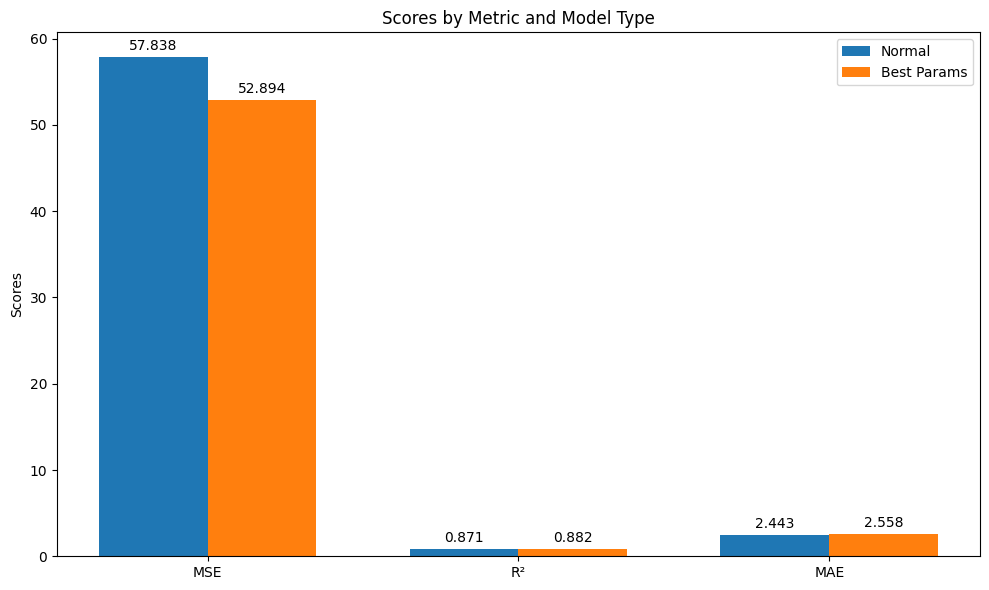

In [73]:


# Defining the results
metrics = ['MSE', 'R²', 'MAE']
normal_results = [round(mse_rf, 3), round(r2_rf, 3), round(mae_rf, 3)]
best_results = [round(mse_rf_best, 3), round(r2_rf_best, 3), round(mae_rf_best, 3)]

# Configuring the plot
x = np.arange(len(metrics))  
width = 0.35  

fig, ax = plt.subplots(figsize=(10, 6))

# Bars for normal results
rects1 = ax.bar(x - width/2, normal_results, width, label='Normal')
# Bars for results with best parameters
rects2 = ax.bar(x + width/2, best_results, width, label='Best Params')

# Labels and title
ax.set_ylabel('Scores')
ax.set_title('Scores by Metric and Model Type')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

# Function to add labels to the bars
def autolabel(rects):
    """Attach a text label above each bar."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

#i don´t put the MAPE because we can´t see the graphic

Save model

In [ ]:
joblib.dump(best_rf_model, 'best_rf_model.pkl')

Load model

In [42]:
loaded_model = joblib.load('best_rf_model.pkl')

********************************************************************

### **LGBM and XGBR regressor**

I check this models because had good results when i did the cross validation

Model

In [74]:

lgbm_model = LGBMRegressor()


xgb_model = XGBRegressor()

Fit LGBM

In [75]:
lgbm_model.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001614 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1954
[LightGBM] [Info] Number of data points in the train set: 76780, number of used features: 12
[LightGBM] [Info] Start training from score 14.469075


LGBMRegressor()

Predict LGBM

In [76]:
lgbm_pred= lr_clf.predict(X_test)

Fit XGB

In [77]:
xgb_model.fit(X_train, y_train)
  

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

Predict XGB

In [78]:
xgb_pred = lr_clf.predict(X_test)

Results

In [79]:

mse_lgbm = mean_squared_error(y_test,lgbm_pred)
mse_xgb = mean_squared_error(y_test, xgb_pred)
r2_lgbm = r2_score(y_test, lgbm_pred)
r2_xgb = r2_score(y_test, xgb_pred)
mae_lgbm = mean_absolute_error(y_test, lgbm_pred)
mae_xgb = mean_absolute_error(y_test, xgb_pred)
mape_lgbm = mean_absolute_error(y_test, lgbm_pred)
mape_xgb = mean_absolute_percentage_error(y_test, xgb_pred)*100


print("MSE Lgbm:", mse_lgbm)
print("MSE Xgb:", mse_xgb)

print("****************************************************************")
print("R² Lgbm:", r2_lgbm)
print("R² Xgb:", r2_xgb)

print("****************************************************************")
print("MAE Lgbm:", mae_lgbm)
print("MAE Xgb:", mae_xgb)

print("****************************************************************")
print("MAPE Lgbm:", mape_lgbm)
print("MAPE Xgb:", mape_xgb)



MSE Lgbm: 338.3441507457836
MSE Xgb: 338.3441507457836
****************************************************************
R² Lgbm: 0.24630363889145146
R² Xgb: 0.24630363889145146
****************************************************************
MAE Lgbm: 10.914100840848604
MAE Xgb: 10.914100840848604
****************************************************************
MAPE Lgbm: 10.914100840848604
MAPE Xgb: 5.824427256172896e+17


Load models:

(Don´t execute hiperparameters cells)


In [80]:
loaded_model = joblib.load('best_lgb_model.pkl')
loaded_model = joblib.load('best_best_lgbm_model.pkl')

Hyperparameters

In [83]:
lgbm_params = {
    'n_estimators': [100, 200, 300],  
    'learning_rate': [0.01, 0.05, 0.1], 
    'max_depth': [-1, 5, 10, 15], 
    'min_child_samples': [0.001, 10, 20, 30], 
    'subsample': [0.8, 0.9, 1.0],  
    'colsample_bytree': [0.8, 0.9, 1.0],
}
lgbm_grid = GridSearchCV(LGBMRegressor(), lgbm_params, cv=5)


lgbm_grid.fit(X_train_scaled, y_train)


print("Best hyperparameters for lgbm:", lgbm_grid.best_params_)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1954
[LightGBM] [Info] Number of data points in the train set: 61424, number of used features: 12
[LightGBM] [Info] Start training from score 14.540270
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1954
[LightGBM] [Info] Number of data points in the train set: 61424, number of used features: 12
[LightGBM] [Info] Start training from score 14.445456
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1954
[LightGBM] [Info] Number of data points in the train set: 61424, number of used features: 12
[LightGBM] [Info] Start t

c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_validation.py:547: FitFailedWarning: 
1620 fits failed out of a total of 6480.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1620 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\lightgbm\sklearn.py", line 1092, in fit
    super().fit(
  File "c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\lightgbm\sklearn.py", lin

Best hyperparameters for lgbm: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 15, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 0.8}


 Fit model with best hyperparameters

In [86]:
best_lgbm_model = LGBMRegressor(colsample_bytree = 1.0, learning_rate = 0.1, max_depth = 15, min_child_samples = 10, n_estimators = 300, subsample = 0.8 )

best_lgbm_model.fit(X_train, y_train)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1954
[LightGBM] [Info] Number of data points in the train set: 76780, number of used features: 12
[LightGBM] [Info] Start training from score 14.469075


LGBMRegressor(max_depth=15, min_child_samples=10, n_estimators=300,
              subsample=0.8)

Predict

In [87]:
best_lgbm_pred = best_rf_model.predict(X_test) 

In [88]:

mse_lgbm_best = mean_squared_error(y_test, best_lgbm_pred)
r2_lgbm_best = r2_score(y_test, best_lgbm_pred)
mae_lgbm_best = mean_absolute_error(y_test, best_lgbm_pred)
mape_lgbm_best =  mean_absolute_percentage_error(y_test, best_lgbm_pred)*100





Hyperparameters XGB

In [85]:
xgb_params = {
    'n_estimators': [100, 150], 
    'learning_rate': [0.05, 0.1],  
    'max_depth': [6, 10], 
    'min_child_weight': [1, 5],  
    'subsample': [0.9, 1.0],  
    'colsample_bytree': [0.9, 1.0], 
}
xgb_grid = GridSearchCV(XGBRegressor(), xgb_params, cv=5)

xgb_grid.fit(X_train_scaled, y_train)


print("Best hyperparameters for xgb:", xgb_grid.best_params_)

Best hyperparameters for xgb: {'colsample_bytree': 0.9, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_weight': 5, 'n_estimators': 150, 'subsample': 1.0}


In [89]:
best_xgb_model = LGBMRegressor(colsample_bytree= 0.9, learning_rate = 0.1, max_depth = 10, min_child_weight = 5, n_estimators = 150, subsample = 0.9)

best_xgb_model.fit(X_train, y_train)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000839 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1954
[LightGBM] [Info] Number of data points in the train set: 76780, number of used features: 12
[LightGBM] [Info] Start training from score 14.469075


LGBMRegressor(colsample_bytree=0.9, max_depth=10, min_child_weight=5,
              n_estimators=150, subsample=0.9)

In [90]:
best_xgb_pred = best_xgb_model.predict(X_test)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


In [91]:
mse_xgb_best = mean_squared_error(y_test, best_xgb_pred)
r2_xgb_best = r2_score(y_test, best_lgbm_pred)
mae_xgb_best = mean_absolute_error(y_test, best_xgb_pred)
mape_xgb_best = mean_absolute_percentage_error(y_test, best_xgb_pred)*100

### Results to compare the best model

In [92]:

print("MSE lgbm:", mse_lgbm_best)
print("MSE xgb:", mse_xgb_best)
print("****************************************************************")
print("R² lgbm:", r2_lgbm_best)
print("R² xgb:", r2_xgb_best)
print("****************************************************************")
print("MAE lgbm:", mae_lgbm_best)
print("MAE xgb:", mae_xgb_best)  
print("****************************************************************")
print("MAPE lgbm:", mape_lgbm_best)
print("MAPE xgb:", mape_xgb_best)  


MSE lgbm: 52.89444277758545
MSE xgb: 57.81714955165734
****************************************************************
R² lgbm: 0.8821721937368905
R² xgb: 0.8821721937368905
****************************************************************
MAE lgbm: 2.5579802984187014
MAE xgb: 3.2488248914139715
****************************************************************
MAPE lgbm: 7425254875333995.0
MAPE xgb: 3.5561792677090936e+16


### Compare model with Random forest regressor

In [93]:

print("MSE lgbm best params:", mse_lgbm_best)
print("MSE xgb best params:", mse_xgb_best)
print("MSE Random Forest Regressor best params:", mse_rf_best)
print("****************************************************************")
print("R² lgbm best params:", r2_lgbm_best)
print("R² xgb best params:", r2_xgb_best)
print("R² Random Forest Regressor best params:", r2_rf_best)
print("****************************************************************")
print("MAE lgbm best params:", mae_lgbm_best)
print("MAE xgb best params:", mae_xgb_best) 
print("MAE Random Forest Regressor best params:", mae_rf_best)
print("****************************************************************")
print("MAPE lgbm best params:", mape_lgbm_best)
print("MAPE xgb best params:", mape_xgb_best) 
print("MAPE Random Forest Regressor best params:", mape_rf_best)



MSE lgbm best params: 52.89444277758545
MSE xgb best params: 57.81714955165734
MSE Random Forest Regressor best params: 52.89444277758545
****************************************************************
R² lgbm best params: 0.8821721937368905
R² xgb best params: 0.8821721937368905
R² Random Forest Regressor best params: 0.8821721937368905
****************************************************************
MAE lgbm best params: 2.5579802984187014
MAE xgb best params: 3.2488248914139715
MAE Random Forest Regressor best params: 2.5579802984187014
****************************************************************
MAPE lgbm best params: 7425254875333995.0
MAPE xgb best params: 3.5561792677090936e+16
MAPE Random Forest Regressor best params: 7425254875333995.0


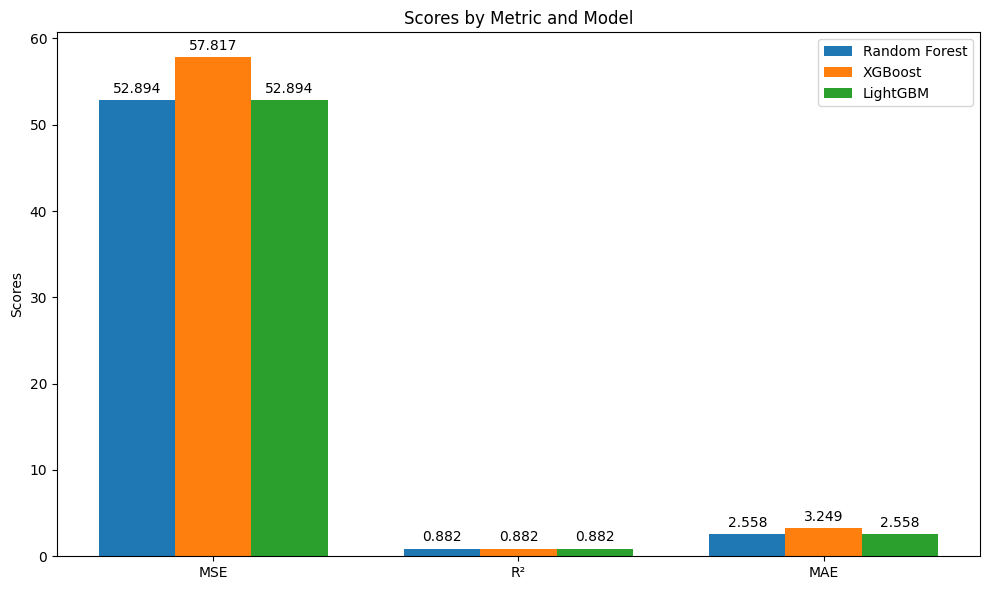

In [94]:

# Define the metrics and their corresponding values
metrics = ['MSE', 'R²', 'MAE']
rf_values = [round(mse_rf_best, 3), round(r2_rf_best, 3), round(mae_rf_best, 3)]
xgb_values = [round(mse_xgb_best, 3), round(r2_xgb_best, 3), round(mae_xgb_best, 3)]
lgbm_values = [round(mse_lgbm_best, 3), round(r2_lgbm_best, 3), round(mae_lgbm_best, 3)]

# Configure the plot
x = np.arange(len(metrics))  
width = 0.25

fig, ax = plt.subplots(figsize=(10, 6))

# Bars for:
rects1 = ax.bar(x - width, rf_values, width, label='Random Forest')

rects2 = ax.bar(x, xgb_values, width, label='XGBoost')

rects3 = ax.bar(x + width, lgbm_values, width, label='LightGBM')

ax.set_ylabel('Scores')
ax.set_title('Scores by Metric and Model')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

# Function to add labels to the bars
def autolabel(rects):
    """Attach a text label above each bar."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

fig.tight_layout()

plt.show()






Save models

In [95]:
joblib.dump(best_xgb_model, 'best_xgb_model.pkl')
joblib.dump(best_lgbm_model, 'best_lgbm_model.pkl')


['best_lgbm_model.pkl']

### **Load models**

In [100]:

loaded_model = joblib.load('best_lr_model.pkl')
loaded_model = joblib.load('best_tree_model.pkl')
loaded_model = joblib.load('best_rf_model.pkl')
loaded_model = joblib.load('best_xgb_model.pkl')
loaded_model = joblib.load('best_best_lgbm_model.pkl')

****************************************************************

# Identify whether the most important risk factors associated with high suicide rates in each country are socioeconomic.

In [96]:
best_rf_model.feature_importances_

array([0.02821538, 0.1682761 , 0.17322646, 0.09650395, 0.05349051,
       0.03726566, 0.02900077, 0.04207283, 0.00737584, 0.12453187,
       0.18761082, 0.05242982])

In [97]:
X_train.columns

Index(['Year', 'SuicideCount', 'CauseSpecificDeathPercentage', 'Population',
       'GDP', 'GDPPerCapita', 'InflationRate', 'EmploymentPopulationRatio',
       'regionname_num', 'sex_num', 'agegroup_num', 'countryname_num'],
      dtype='object')

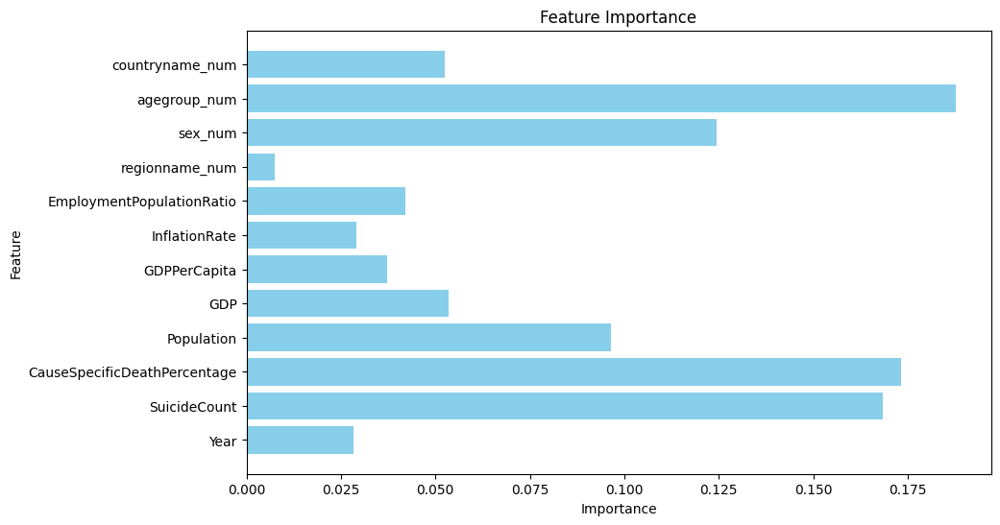

In [98]:

importances = best_rf_model.feature_importances_


feature_names = X_train.columns


plt.figure(figsize=(10, 6))
plt.barh(feature_names, importances, color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()

We can see that socioeconomic rates is not the first cause of suicides.

## Rank countries according to their perceived need for mental health and suicide prevention intervention and resources.

In [99]:
X_train.columns

Index(['Year', 'SuicideCount', 'CauseSpecificDeathPercentage', 'Population',
       'GDP', 'GDPPerCapita', 'InflationRate', 'EmploymentPopulationRatio',
       'regionname_num', 'sex_num', 'agegroup_num', 'countryname_num'],
      dtype='object')

In [105]:

train_sorted = train_set.sort_values(by=target, ascending=False) #sort descending, by target
train_unique = train_sorted.drop_duplicates(subset=['countryname_num']) #duplicates
top_countries = train_unique[['countryname_num']] #df

top_countries


,countryname_num
31458,254
26952,222
10838,84
80958,740
39038,348
...,...
74543,690
109419,512
26817,818
108259,458


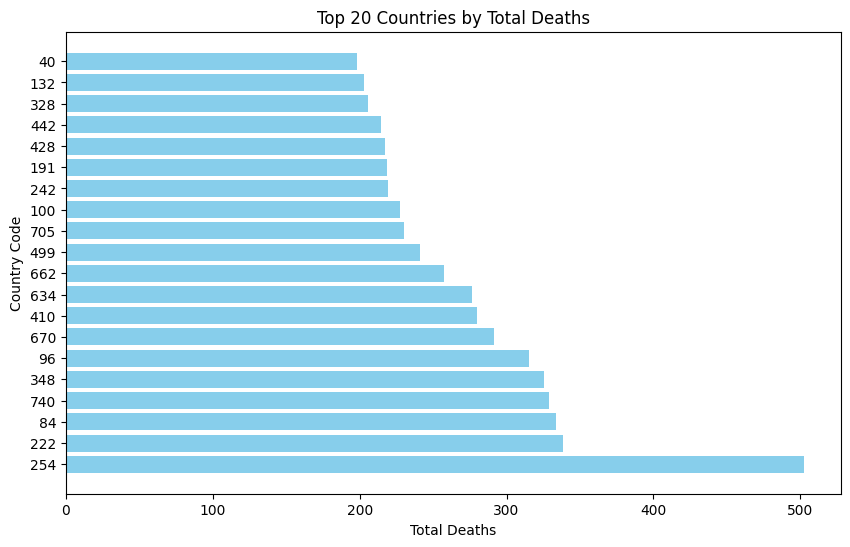

In [106]:

# total num per country
country_death_counts = train_unique.groupby('countryname_num')[target].sum()

# Order counties
country_death_counts_sorted = country_death_counts.sort_values(ascending=False)


top_20_countries = country_death_counts_sorted.head(20) # I do like this to see the graphs


plt.figure(figsize=(10, 6))
plt.barh(top_20_countries.index.astype(str), top_20_countries.values, color='skyblue') 
plt.xlabel('Total Deaths')
plt.ylabel('Country Code')
plt.title('Top 20 Countries by Total Deaths')


plt.show()
